# FDW Crop production data profiling - ET admin level 2

In [1]:
import os, sys, glob, json
os.chdir('../gscd/notebook/')
from itertools import product, compress, chain
from functools import reduce
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import requests
import numpy as np
import pandas as pd
import geopandas as gpd
from tools import save_hdf, save_npz, load_npz, PrintAdminUnits, PlotAdminShapes
from tools import FDW_PD_Sweeper, FDW_PD_AvalTable, FDW_PD_Compiling, FDW_PD_GrainTypeAgg, FDW_PD_ValidateFnidName
from tools import FDW_PD_CreateAdminLink, FDW_PD_RatioAdminLink, FDW_PD_ConnectAdminLink
from tools import FDW_PD_CaliSeasonYear
from tools_graphic import PlotBarProduction, PlotLinePAY, PlotHeatCropSystem, PlotHeatSeasonData
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
pd.options.mode.chained_assignment = None
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)


In [2]:
# CPCV2 grain code ------------------------------ #
grain_code = pd.read_hdf('../data/crop/grain_cpcv2_code.hdf')
product_category = grain_code[['product', 'product_category']].set_index('product').to_dict()['product_category']
# ----------------------------------------------- #

# Load FEWS NET administrative boundaries ------- #
epsg = 'EPSG:32638'
fn_shapes = sorted(glob.glob('../data/shapefile/fewsnet/ET_Admin?_????.shp'))
shape_all = []
for fn in fn_shapes:
    name = fn[-18:-4]
    exec('%s = gpd.read_file("%s").to_crs("%s")' % (name, fn, epsg))
    exec('%s["area"] = %s["geometry"].area/10**6' % (name, name))
    exec('shape_all.append(%s)' % (name))
shape_all = pd.concat(shape_all, axis=0).reset_index(drop=True)
PrintAdminUnits(shape_all)
# ----------------------------------------------- #

# FDW API host address -------------------------- #
host = 'https://fdw.fews.net'
#read in username and password
auth = tuple(json.loads(open('token.json', "r").read()))
parameters = {
    'format': 'json',
    'country': 'Ethiopia',
    'product': 'R011',
    'survey_type': 'crop:best'
}
endpoint = '/api/cropproductionindicatorvalue/'
response = requests.get(host + endpoint, auth=auth, params=parameters, proxies={},verify=False)
response.raise_for_status()
df = pd.DataFrame.from_records(response.json())
df_origin = df.copy()
# ----------------------------------------------- #

- FEWS NET admin shapefiles ------------------- #
| year	 | Admin1   | # units   | Admin2   | # units   | Admin3   | # units   |
| 1994	 | ET1994A1 | 11	| ET1994A2	| 66	| nan	| 0	|
| 2001	 | ET2001A1 | 11	| ET2001A2	| 68	| nan	| 0	|
| 2003	 | ET2003A1 | 11	| ET2003A2	| 73	| nan	| 0	|
| 2007	 | ET2007A1 | 11	| ET2007A2	| 75	| nan	| 0	|
| 2008	 | ET2008A1 | 11	| ET2008A2	| 80	| nan	| 0	|
| 2014	 | ET2014A1 | 11	| ET2014A2	| 77	| nan	| 0	|
| 2019	 | ET2019A1 | 11	| ET2019A2	| 84	| nan	| 0	|
| 2020	 | ET2020A1 | 11	| ET2020A2	| 91	| nan	| 0	|
----------------------------------------------- #


/Users/wanders7/opt/anaconda3/lib/python3.8/site-packages/urllib3/connectionpool.py:1045: InsecureRequestWarning: Unverified HTTPS request is being made to host 'fdw.fews.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


In [5]:
#df[((df.fnid=='ET1994A20609')&(pd.to_datetime(df.period_date).dt.to_period('Y')=='2000'))]
df.loc[((df.fnid=='ET1994A20724')&(df['product']=='Maize (Corn)')&
    (df['indicator']=='Area Planted')&(df['status']=='Collected')&
    (pd.to_datetime(df.period_date).dt.to_period('Y')=='2000'))]

,country,source_organization,source_document,geographic_unit_full_name,geographic_unit_name,fnid,admin_0,admin_1,admin_2,admin_3,admin_4,population_group,crop_production_system,start_date,period_date,season_name,season_type,season_date,season_year,document_type,preference_rating,indicator_group,indicator,status,value,population,value_per_capita,product,country_code,locality_name,unit,unit_name,cpcv2,cpcv2_description,geographic_group,fewsnet_region,id,datacollectionperiod,datacollection,datasourcedocument,datasourceorganization,indicator_abbreviation,locality,geographic_unit,season,dataseries,dataseries_name,specialization_type,dataseries_specialization_type,data_usage_policy,created,modified,status_changed,collection_status,collection_status_changed,collection_schedule,collection_date,publication_name
2974,Ethiopia,"Central Statistical Agency, Ethiopia:","Agricultural Sample Survey, Ethiopia","Burji, SNNPR, Ethiopia",Burji,ET1994A20724,Ethiopia,SNNPR,Burji,None,None,,None,2000-01-01,2000-01-31,Meher,Harvest,1999-10-01,Meher 1999,Final Government Crop Production,None,Crop Production,Area Planted,Collected,44000.0,42849.0,1.026862,Maize (Corn),ET,"Burji, SNNPR, Ethiopia (01/01/1994 - 12/31/2000)",ha,hectare,R01122AA,"Maize grain (corn), other",Eastern Africa,East Africa,27149800,65266,73446,3228,2013,crop:planted,26443,51919,11,6668381,"Agricultural Sample Survey, Ethiopia: Burji, S...",/SurveyIndicatorValue/CropProductionIndicatorV...,/SurveyPopulationIndicator/CropProductionIndic...,Public,2021-12-08T22:35:47,2021-12-08T22:35:47,2021-12-08T23:22:20,Published,2022-01-26T20:21:45,Ad Hoc,2000-01-31,"Agricultural Sample Survey, 1995-1996/2014-201..."


In [3]:
# Manual Pre-processing before Sweeping --------- #
# 1. Default setting
# a.1) None-type crop production system
df.loc[df['crop_production_system'].isna(), 'crop_production_system'] = 'none'
df.loc[df['crop_production_system'] == '', 'crop_production_system'] = 'none'
# a.2) Early in the record the catch-all crop production system is 'all' rather than none. Make these to none-type
df.loc[df['crop_production_system'] == 'all', 'crop_production_system'] = 'none'
# b) None-type population group
df.loc[df['population_group'].isna(), 'population_group'] = 'none'
df.loc[df['population_group'] == '', 'population_group'] = 'none'
# ----------------------------------------------- #

#Drop the blank (nan) rows that are duplicates of rows that do have data
df=df[np.isfinite(df.value)]
#limit the data to admin 2 resolution
df=df.dropna(subset=['admin_2'])
rows = ['fnid','season_year', 'product','indicator','crop_production_system']

#The Maize Grain (Fresh) crop code only exists in 2020, when the yield issue was fixed, but there are now duplicates of the data
# drop the Maize (Corn) data in 2020, then rename the crop data for Maize Grain (Fresh) to Maize (corn)
df = df[~((df['product'] == 'Maize (Corn)')&(pd.to_datetime(df.period_date).dt.year==2020))]
df.loc[(df['product'] == 'Maize Grain (Fresh)'),'product'] = 'Maize (Corn)'

#Barley (White) only exists in years/areas where Barley (Unspecified) does not exist. Rename to a single Barley (Unspecified) class
df.loc[(df['product'] == 'Barley (White)'),'product'] = 'Barley (Unspecified)'

#Drop 2018 until it is fixed (incorrect conversion from quintals to tons I think)
df = df[~(pd.to_datetime(df.period_date).dt.to_period('Y')=='2018')]

## Note: I suspect the following two calues are actually the same thing

#drop observations from Kemashi in 2000. The only crop with data (sorghum) is missing ha, although it exists in the source doc
df = df[~((df.fnid=='ET1994A20609')&(pd.to_datetime(df.period_date).dt.to_period('Y')=='2000'))]


#replace a mistyped value of 44000 with 440 (confirmed with sourcr docs)
df.loc[((df.fnid=='ET1994A20724')&(df['product']=='Maize (Corn)')&
    (df['indicator']=='Area Planted')&(df['status']=='Collected')&
    (pd.to_datetime(df.period_date).dt.to_period('Y')=='2000')),'value']=440


# FDW Production Data Inspection ---------------- #
df, df_raw = FDW_PD_Sweeper(df)
table_dict = FDW_PD_AvalTable(df, shape_all)
# ----------------------------------------------- #

# # FEWS NET Shapefile comparison ----------------- #
shape_used = pd.concat([ET_Admin2_1994,ET_Admin2_2001,ET_Admin2_2003,ET_Admin2_2007,ET_Admin2_2008,ET_Admin2_2014,ET_Admin2_2019,ET_Admin2_2020], axis=0)
PlotAdminShapes(shape_used, label=True)
# # ----------------------------------------------- #


- Remove missing records ---------------------- #
Orignial data points: 14,612
Removed 40 "Missing Value" points
5,025/5,025 "Area Planted" points are retained.
4,790/4,799 "Quantity Produced" points are retained.
4,757/4,788 "Yield" points are retained.
Current data points: 14,572

- Minor changes are applied ------------------- #

- Basic information --------------------------- #
Data period: 1998 - 2019
8 grain types are found: Barley (Unspecified), Maize (Corn), Millet (Finger), Mixed Teff, Oats (Unspecified), Rice (Paddy), Sorghum, Wheat Grain
1 seasons are found: Meher (10-01)
1 crop production system are found: none
Data sources include:
[1] Central Statistical Agency, Ethiopia:  --- Agricultural Sample Survey, Ethiopia
[2] Central Statistics Office (CSO), Ethiopia --- Central Statistical Agency, Ethiopia
Administrative-1 fnids: 0
Administrative-2 fnids: 445
0 reporting units are found: 

- Total production over time ------------------ #
season_name           Meher
             

## Ethiopia
Ethiopia crop seasonal calendar

![FEWS NET](https://fews.net/sites/default/files/styles/large_width_880/public/2023-03/seasonal-calendar-ethiopia.png?itok=xWM8Nlr6)

![FAO](https://www.fao.org/giews/countrybrief/country/ETH/graphics/1_2023-06-15.jpg)


- comparison of boundaries
![image](../gscd/figures/ET_admin_shapes.png)

- In Ethiopia, basd on the FEWS NET data, there were admin unit changes in 1994, 2001, 2003, 2007, 2008, 2014, 2019, and 2020

| year	 | Admin1   | # units   | Admin2   | # units   |
| :---: | :----:  | :----:   | :----:   | :---:  |
| 1994	 | ET1994A1 | 11	| ET1994A2	| 66	| nan	| 0	|
| 2001	 | ET2001A1 | 11	| ET2001A2	| 68	| nan	| 0	|
| 2003	 | ET2003A1 | 11	| ET2003A2	| 73	| nan	| 0	|
| 2007	 | ET2007A1 | 11	| ET2007A2	| 75	| nan	| 0	|
| 2008	 | ET2008A1 | 11	| ET2008A2	| 80	| nan	| 0	|
| 2014	 | ET2014A1 | 11	| ET2014A2	| 77	| nan	| 0	|
| 2019	 | ET2019A1 | 11	| ET2019A2	| 84	| nan	| 0	|
| 2020	 | ET2020A1 | 11	| ET2020A2	| 91	| nan	| 0	|
----------------------------------------------- #


- There is a 2020 shapefile, but no data associated with it so we use 2019 as the most recent

In [4]:
sorted(list(df_origin['season_year'].unique()))

# Define the latest shapefile ------------------- #
latest_level = 2
shape_latest = ET_Admin2_2019.copy().to_crs('epsg:4326')
# ----------------------------------------------- #

# Validation of FNIDs and Names ----------------- #
df = FDW_PD_ValidateFnidName(df, shape_used, shape_latest)
# ----------------------------------------------- #

# FDW Production Data Compiling ----------------- #
area, prod = FDW_PD_Compiling(df, shape_used)
area_all, prod_all = area.copy(), prod.copy()
mdx_pss = area.columns.droplevel([0,1]).unique()
# ----------------------------------------------- #

ET1994A21706:	"North Shewa (OR)" (FDW) is changed to "North Shewa" (shapefile).
ET1994A20305:	"North Shewa (AM)" (FDW) is changed to "North Shewa" (shapefile).
ET2001A20406:	"North Shewa (OR)" (FDW) is changed to "North Shewa" (shapefile).
ET2001A20305:	"North Shewa (AM)" (FDW) is changed to "North Shewa" (shapefile).
ET2003A20406:	"North Shewa (OR)" (FDW) is changed to "North Shewa" (shapefile).
ET2003A20305:	"North Shewa (AM)" (FDW) is changed to "North Shewa" (shapefile).
ET2007A20406:	"North Shewa (OR)" (FDW) is changed to "North Shewa" (shapefile).
ET2007A20305:	"North Shewa (AM)" (FDW) is changed to "North Shewa" (shapefile).
ET2008A20406:	"North Shewa (OR)" (FDW) is changed to "North Shewa" (shapefile).
ET2008A20305:	"North Shewa (AM)" (FDW) is changed to "North Shewa" (shapefile).
ET2014A20305:	"North Shewa (AM)" (FDW) is changed to "North Shewa" (shapefile).
ET2014A20406:	"North Shewa (OR)" (FDW) is changed to "North Shewa" (shapefile).
ET2019A21202:	"Agniwak" (FDW) is changed

In [5]:
# Link admin boundaries ------------------------- #
link_1994, over_1994 = FDW_PD_CreateAdminLink(ET_Admin2_1994, ET_Admin2_2019, 'ADMIN2', 'ADMIN2', prod, epsg)
link_2001, over_2001 = FDW_PD_CreateAdminLink(ET_Admin2_2001, ET_Admin2_2019, 'ADMIN2', 'ADMIN2', prod, epsg)
link_2003, over_2003 = FDW_PD_CreateAdminLink(ET_Admin2_2003, ET_Admin2_2019, 'ADMIN2', 'ADMIN2', prod, epsg)
link_2007, over_2007 = FDW_PD_CreateAdminLink(ET_Admin2_2007, ET_Admin2_2019, 'ADMIN2', 'ADMIN2', prod, epsg)
link_2008, over_2008 = FDW_PD_CreateAdminLink(ET_Admin2_2008, ET_Admin2_2019, 'ADMIN2', 'ADMIN2', prod, epsg)
link_2014, over_2014 = FDW_PD_CreateAdminLink(ET_Admin2_2014, ET_Admin2_2019, 'ADMIN2', 'ADMIN2', prod, epsg)


# Crop specific ratios
link_ratio_1994 = FDW_PD_RatioAdminLink(link_1994, prod, over_1994, mdx_pss)
link_ratio_2001 = FDW_PD_RatioAdminLink(link_2001, prod, over_2001, mdx_pss)
link_ratio_2003 = FDW_PD_RatioAdminLink(link_2003, prod, over_2003, mdx_pss)
link_ratio_2007 = FDW_PD_RatioAdminLink(link_2007, prod, over_2007, mdx_pss)
link_ratio_2008 = FDW_PD_RatioAdminLink(link_2008, prod, over_2008, mdx_pss)
link_ratio_2014 = FDW_PD_RatioAdminLink(link_2014, prod, over_2014, mdx_pss)

# Merge link_ratio
assert link_ratio_1994.keys() == link_ratio_2014.keys()
assert link_ratio_2001.keys() == link_ratio_2014.keys()
assert link_ratio_2003.keys() == link_ratio_2014.keys()
assert link_ratio_2007.keys() == link_ratio_2014.keys()
assert link_ratio_2008.keys() == link_ratio_2014.keys()

link_merged = [link_ratio_1994, link_ratio_2001,link_ratio_2003,link_ratio_2007,link_ratio_2008, link_ratio_2014]
fnids_new = list(link_merged[0].keys())
link_ratio = dict()
for fnid in fnids_new:
    container = []
    for link in link_merged:
        container.append(link[fnid])
    link_ratio[fnid] = pd.concat(container, axis=1)
# Add current unit to link_ratio
for fnid_new in link_ratio.keys():
    link_ratio[fnid_new][fnid_new] = 1.0
    link_ratio[fnid_new] = link_ratio[fnid_new].sort_index(axis=1, ascending=False)
# Connect data with AdminLink
area_new, prod_new = FDW_PD_ConnectAdminLink(link_ratio, area, prod, validation=False)
# ----------------------------------------------- #


CBR is considered for 'ET1994A21728' as no record found in: ['ET2019A20415']
CBR is considered for 'ET1994A20201' as no record found in: ['ET2019A20201']
CBR is considered for 'ET1994A20202' as no record found in: ['ET2019A20202']
CBR is considered for 'ET1994A21501' as no record found in: ['ET2019A21501']
CBR is considered for 'ET1994A21410' as no record found in: ['ET2019A21401']
CBR is considered for 'ET2001A20426' as no record found in: ['ET2019A20415']
CBR is considered for 'ET2001A20201' as no record found in: ['ET2019A20201']
CBR is considered for 'ET2001A20202' as no record found in: ['ET2019A20202']
CBR is considered for 'ET2001A21501' as no record found in: ['ET2019A21501']
CBR is considered for 'ET2001A21410' as no record found in: ['ET2019A21401']
CBR is considered for 'ET2003A20201' as no record found in: ['ET2019A20201']
CBR is considered for 'ET2003A20202' as no record found in: ['ET2019A20202']
CBR is considered for 'ET2003A21501' as no record found in: ['ET2019A21501']

In [6]:
# Manual correction ----------------------------- #
crop_new = prod_new/area_new

# Complete long format DataFrame ---------------- #
df_area = area_new.T.stack().rename('value').reset_index()
df_area['indicator'] = 'area'
df_prod = prod_new.T.stack().rename('value').reset_index()
df_prod['indicator'] = 'production'
df_yield = (prod_new/area_new).T.stack().rename('value').reset_index()
df_yield['indicator'] = 'yield'
stack = pd.concat([df_area, df_prod, df_yield], axis=0)
# Add "growing year"
cols = ['season_name','product','crop_production_system','planting_month','harvest_year','harvest_month','planting_year']
season_table = df[cols].drop_duplicates()
stack = stack.merge(season_table, on=cols[:-1])
# Add country and admin names
stack = stack.merge(df[['fnid','country','country_code','admin_1','admin_2']].drop_duplicates(), on='fnid', how='inner')
names = [
    'fnid','country','country_code','admin_1','admin_2','name',
    'product','season_name','planting_year','planting_month','harvest_year','harvest_month',
    'crop_production_system','indicator','value'
]
stack_gscd = stack[names]
stack_gscd['gscd_code'] = 'calibrated'
# ----------------------------------------------- #
# Reported FDW data ----------------------------- #
stack_fdw = df[names]
stack_fdw['indicator'] = stack_fdw['indicator'].replace({'Area Harvested':'area','Quantity Produced':'production','Yield':'yield'})
stack_fdw['gscd_code'] = 'reported'
# ----------------------------------------------- #
# Final Processing ------------------------------ #
stack = pd.concat([stack_fdw,stack_gscd], axis=0).reset_index(drop=True)
# No concerns found for grain types
stack['product'] = stack['product'].replace(product_category)
# Calibration of Growing and Harvest year and season
cs = {
    'Meher': {'planting_month':{'10-01':'10-01'},'harvest_month':{'01-01':'01-01'}},
}
cy = {}
stack, df, link_ratio = FDW_PD_CaliSeasonYear(stack, df, link_ratio, cs, cy)
stack.loc[stack['admin_1'].isna(), 'admin_1'] = 'none'
stack.loc[stack['admin_2'].isna(), 'admin_2'] = 'none'
# # ----------------------------------------------- #

# Save data
save_hdf('../data/crop/adm_crop_production_ET.hdf', stack)
save_hdf('../data/crop/adm_crop_production_ET_raw.hdf', df)
save_npz('../data/crop/adm_crop_production_ET_ratio.npz', link_ratio)


../data/crop/adm_crop_production_ET.hdf is saved.
../data/crop/adm_crop_production_ET_raw.hdf is saved.
../data/crop/adm_crop_production_ET_ratio.npz is saved.


In [7]:
#import pandas as pd
#import numpy as np
#from matplotlib import pyplot as plt
#import plotly.express as px
#import os
#import random
#from scipy import ndimage
#stack=stack[stack['gscd_code'] == 'calibrated']
#stack['fill_status'] = 'data'
#stack['missing_status']=''

#df2 = agg_admin(df,2,'Ethiopia')
#stack2 = agg_admin(stack,2,'Ethiopia')
# Save the aggregated data
#save_hdf('../data/crop/adm_crop_production_ET_admin2to1.hdf', stack2)
#save_hdf('../data/crop/adm_crop_production_ET_raw_admin2to1.hdf', df2)


../figures/ET_bar_natgrainprod_Meher.png is saved.


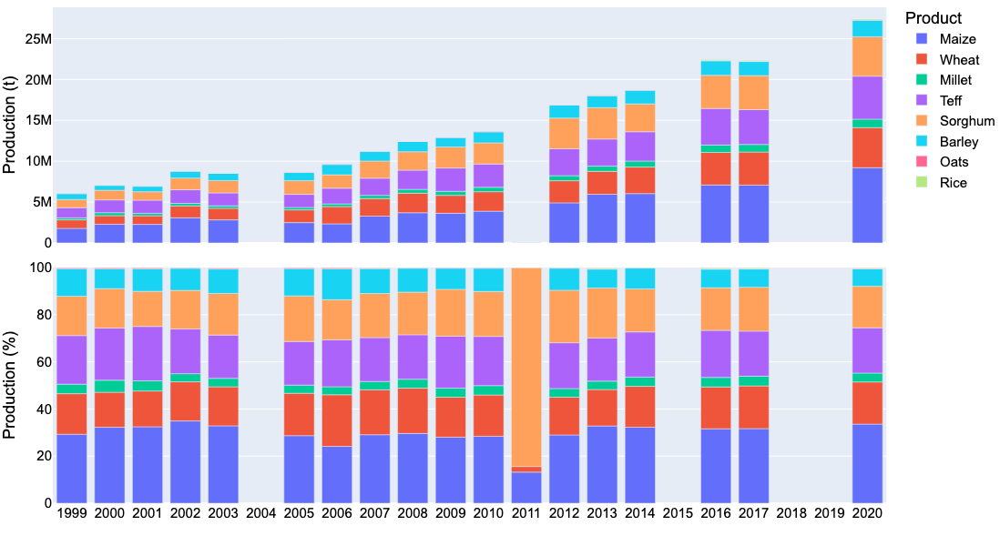

In [8]:
# Bar chart of national grain production
country_iso, country_name = 'ET', 'Ethiopia'
df = pd.read_hdf('../data/crop/adm_crop_production_%s.hdf' % country_iso)
df = df[df['gscd_code']=='calibrated']; df['year'] = df['harvest_year']
year = [df['year'].min(), df['year'].max()]
product_order = ['Maize', 'Wheat','Millet', 'Teff','Sorghum','Barley','Oats','Rice']
for season_name in ['Meher']:
    footnote = 'National grain production in %s - %s' % (country_name, season_name)
    fn_save = '../figures/%s_bar_natgrainprod_%s.png' % (country_iso, season_name)
    sub = df[df['season_name'] == season_name]
    fig = PlotBarProduction(sub, year, product_order, footnote, fn_save)
    fig.show()


../figures/ET_line_pay_Barley_Meher.png is saved.


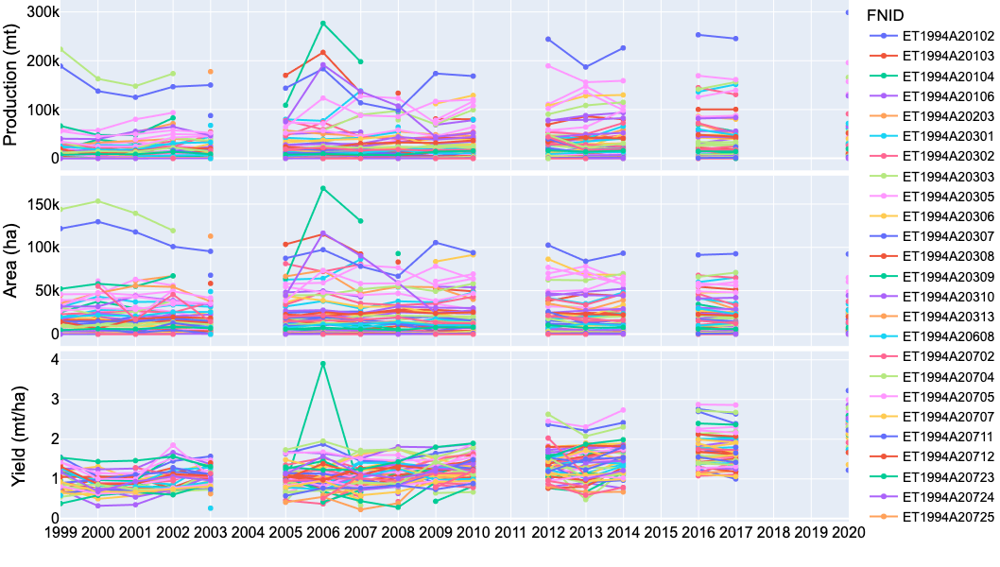

../figures/ET_line_pay_Maize_Meher.png is saved.


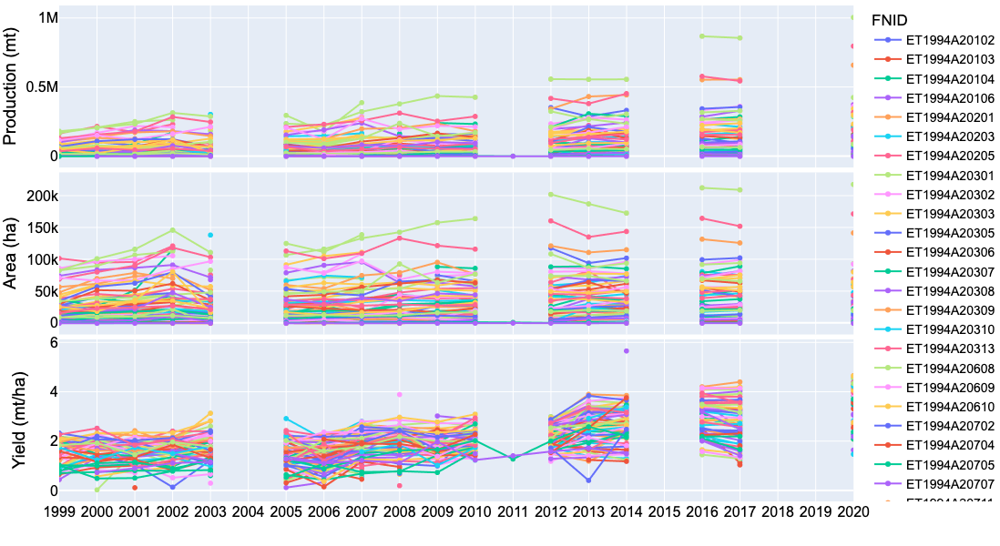

../figures/ET_line_pay_Millet_Meher.png is saved.


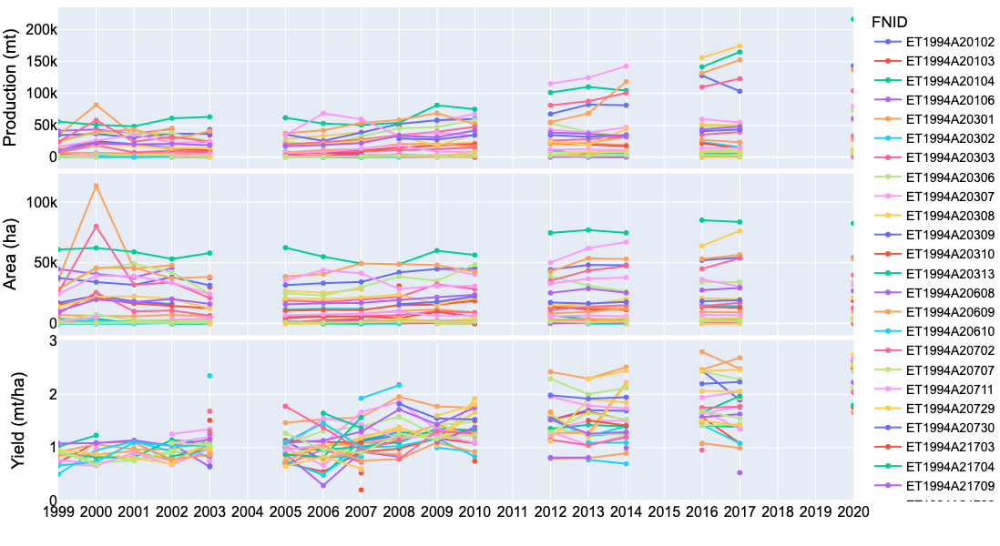

../figures/ET_line_pay_Teff_Meher.png is saved.


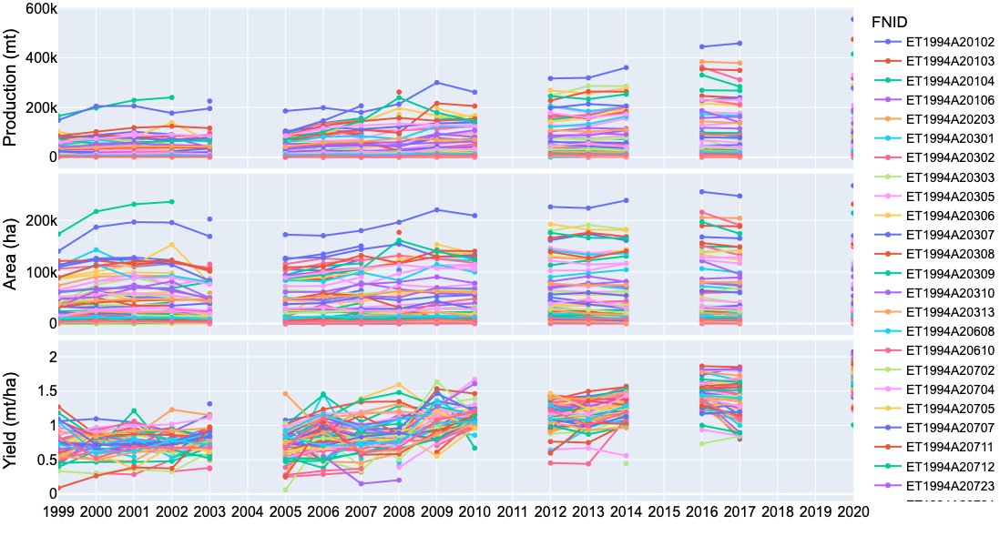

../figures/ET_line_pay_Sorghum_Meher.png is saved.


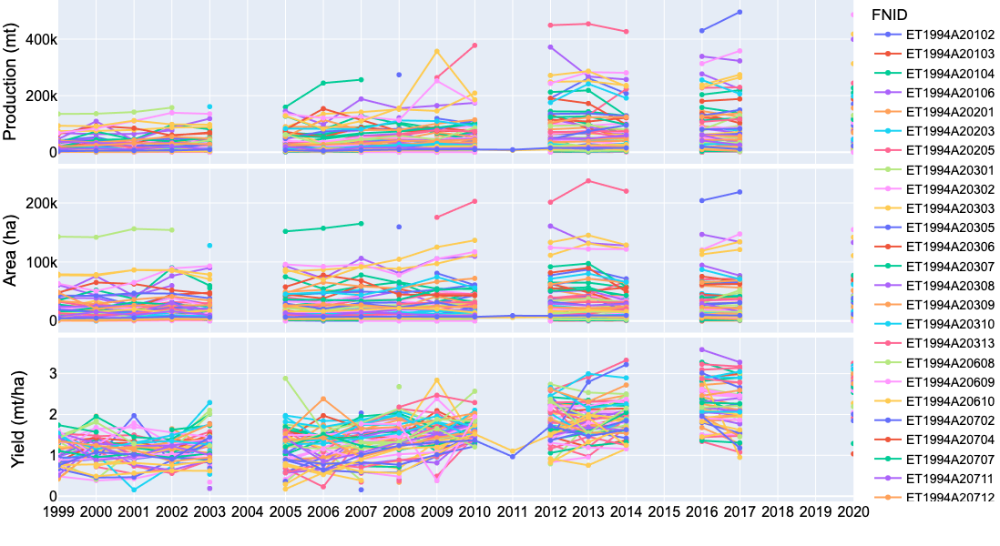

../figures/ET_line_pay_Wheat_Meher.png is saved.


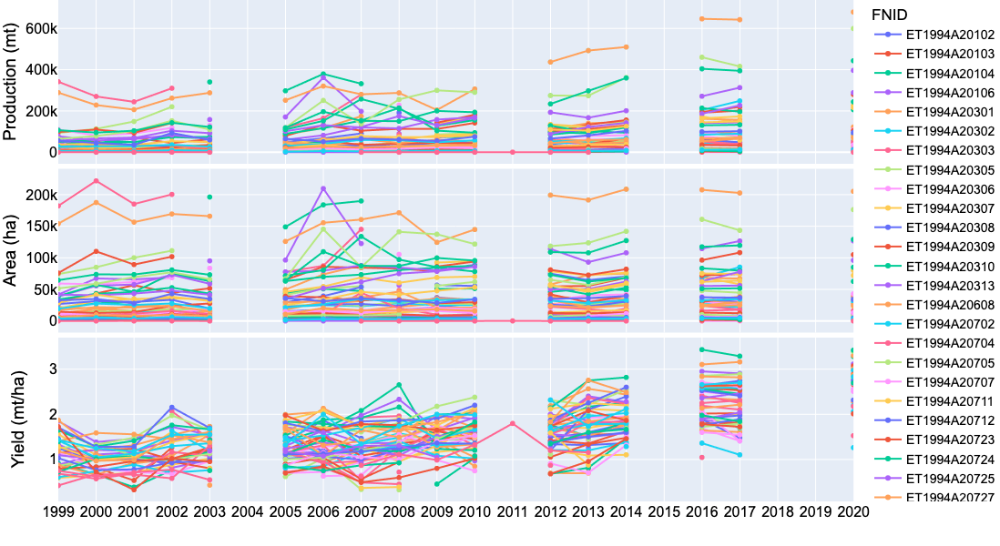

../figures/ET_line_pay_Rice_Meher.png is saved.


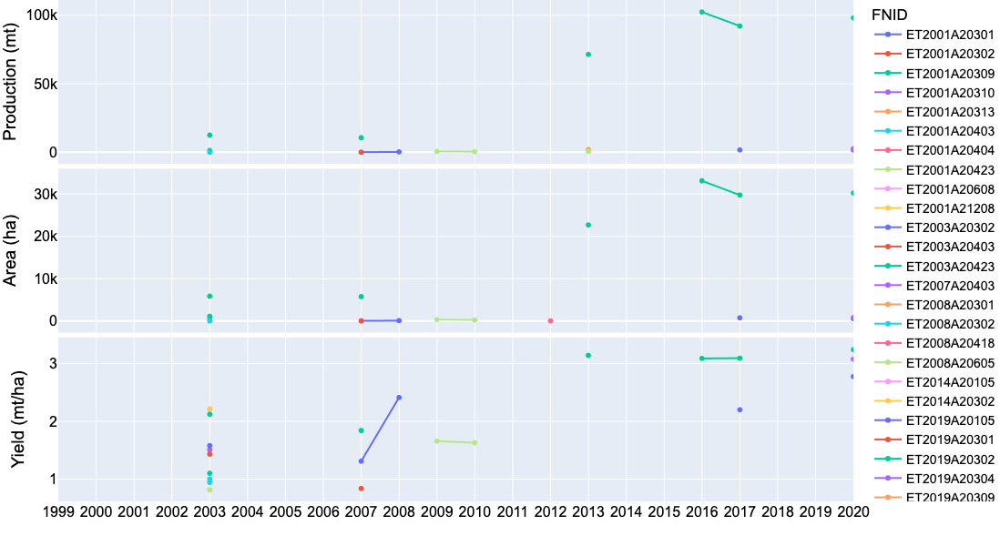

../figures/ET_line_pay_Oats_Meher.png is saved.


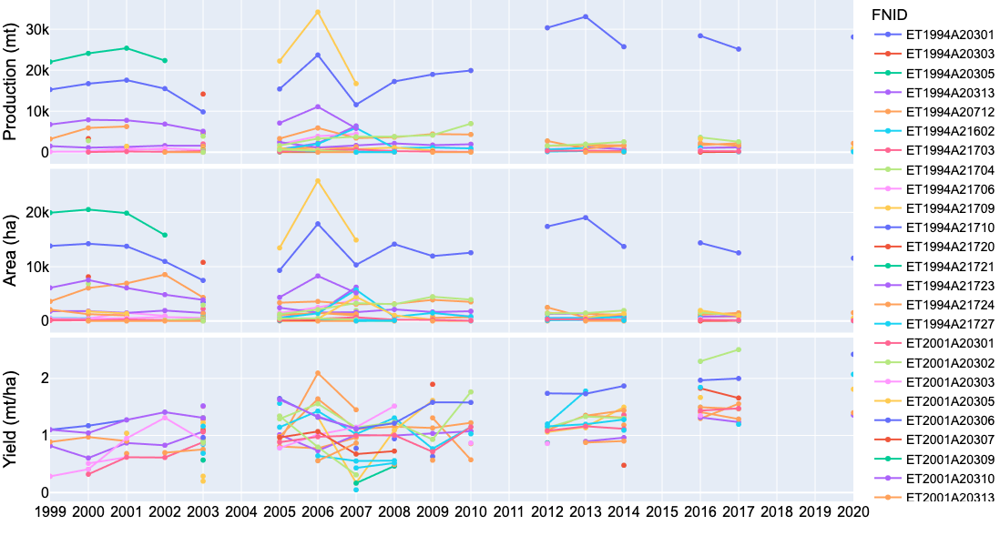

In [9]:
# Lineplot of Production-Area-Yield (PAY) time-series
country_iso, country_name = 'ET', 'Ethiopia'
df = pd.read_hdf('../data/crop/adm_crop_production_%s.hdf' % country_iso)
#df = df[df['gscd_code']=='calibrated']; 
df['year'] = df['harvest_year']
year = [df['year'].min(), df['year'].max()]
product_season = [
    ['Barley', 'Meher'],
    ['Maize', 'Meher'],
    ['Millet', 'Meher'],
    ['Teff', 'Meher'],
    ['Sorghum', 'Meher'],
    ['Wheat', 'Meher'],
    ['Rice', 'Meher'],
    ['Oats', 'Meher'],
]
for product_name, season_name in product_season:
    footnote = 'Production-Area-Yield (PAY) time-series of %s - %s - %s' % (country_iso, product_name, season_name)
    fn_save = '../figures/%s_line_pay_%s_%s.png' % (country_iso, product_name, season_name)
    sub = df[(df['product'] == product_name) & (df['season_name'] == season_name)]
    fig = PlotLinePAY(sub, year, footnote, fn_save)
    fig.show()

In [10]:
# Calibrated PAY time-series per FNID
from tools_graphic import PlotLineCropTS
country_iso, country_name = 'ET', 'Ethiopia'
df = pd.read_hdf('../data/crop/adm_crop_production_%s.hdf' % country_iso)
df = df[df['gscd_code']=='calibrated']; df['year'] = df['harvest_year']
link_ratio = load_npz('../data/crop/adm_crop_production_%s_ratio.npz' % country_iso)
year_all = np.arange(df['year'].min(), df['year'].max()+1)
product_season = [
    ['Barley', 'Meher'],
    ['Maize', 'Meher'],
    ['Millet', 'Meher'],
    ['Teff', 'Meher'],
    ['Sorghum', 'Meher'],
    ['Wheat', 'Meher'],
    ['Rice', 'Meher'],
    ['Oats', 'Meher'],
]
for product_name, season_name in product_season:
    sub = df[
        (df['product'] == product_name) &
        (df['season_name'] == season_name)
    ]
    for fnid in sub['fnid'].unique():
        sub_fps = sub[sub['fnid'] == fnid]
        fn_save = '../figures/crop_calibrated/%s_%s_%s_%s.png' % (country_iso, product_name, season_name, fnid)
        fig = PlotLineCropTS(sub_fps, fnid, product_name, season_name, link_ratio, year_all, fn_save)


../figures/crop_calibrated/ET_Barley_Meher_ET2019A20101.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20102.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20103.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20104.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20105.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20106.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20301.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20302.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20303.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20304.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20305.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20306.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20307.png is saved.
../figures/crop_calibrated/ET_Barley_Meher_ET2019A20308.png is saved.
../figures/crop_cali